<font size="10"> **Oriented Bounding Box Implementation**

Imports and setting preperations

In [1]:
from keras.optimizers import Adam
import tensorflow as tf
import numpy as np
from google.colab.patches import cv2_imshow
import cv2
import matplotlib.pyplot as plt
import torch
from tensorflow.keras.preprocessing.image import load_img
from tensorflow.keras.preprocessing.image import img_to_array
from keras.models import Model
from sklearn.model_selection import train_test_split
import albumentations as A
import os
import math

In [2]:
# Load the TensorBoard notebook extension
%load_ext tensorboard

In [3]:
print(f"Is cuda available: {torch.cuda.is_available()}")
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"The device is: {device}")

Is cuda available: True
The device is: cuda


<font size="6"> Helper functions for future use

In [4]:
# This function returns the model's prediction of label and object detection box
def predict_image(image, model):
  # pre process the image so is would fit the model's expected input
  image = img_to_array(image) / 255.0
  image = np.expand_dims(image, axis=0)

  # predict the label and the bounding box of the object in the image
  box = model.predict(image)

  return box


# This function draws the label and the object's box on the image, according to the given predictions
def prepare_image(image, box_pred):
  (h, w) = image.shape[:2]

  # scale the predicted bounding box coordinates according to the image's dimensions
  x1, y1, x2, y2, x3, y3, x4, y4 = box_pred[0]
  x1 = int(x1 * w)
  y1 = int(y1 * h)
  x2 = int(x2 * w)
  y2 = int(y2 * h)
  x3 = int(x3 * w)
  y3 = int(y3 * h)
  x4 = int(x4 * w)
  y4 = int(y4 * h)

  # get the object's oriented box polygon
  polygon = np.array([[x1,y1], [x2,y2], [x3,y3], [x4,y4]], np.int32)
  polygon = polygon.reshape((-1, 1, 2))

  # draw the polygon outlines on the image
  cv2.polylines(image, [polygon], True, (0, 255, 255), thickness=2)

  return image

In [5]:
# This function receives 2D datapoints, ans sorts them clockwise, with the first point being the minimal 2D point
def sort_points_clockwise(points):
    start = min(points, key=lambda p: (p[1], p[0]))
    sorted_points = sorted(points, key=lambda p: math.atan2(p[1]-start[1], p[0]-start[0]))
    return sorted_points

<font size="6"> Data Preperation

The dataset for the OBB part of the project is from the dataset of the project ["MSOE Logo Detector Computer Vision Project"](https://universe.roboflow.com/zachary-wentz-3e6ms/msoe-logo-detector), that contains oriented bounding boxes around cars license plates.

In [6]:
%%capture
!wget https://universe.roboflow.com/ds/6RJ1MDeAU6?key=M8McBaF4tf -O Dataset.zip
!unzip Dataset.zip -d Dataset

Load images and their oriented bounding boxes for the training and validation process

In [7]:
images = []
boxes = []

# iterate through the train folder and the validation folder
for i in range(2):
  if i == 0:
    folder = "./Dataset/train/"
  else:
    folder = "./Dataset/valid/"

  image_files = os.listdir(folder + 'images')
  # iterate through each image and load its data
  for image_name in image_files:
    # load the image's oriented bounding box data
    with open(folder + 'labelTxt/' + image_name[:-3] + 'txt') as f:
      data = f.read().strip().split("\n")

    # get the four 2D datapoints of the oriented bounding box
    x1, y1, x2, y2, x3, y3, x4, y4, _, _ = data[0].split(" ")

    # load the image and give them default size
    image = cv2.imread(folder + 'images/' + image_name)
    (h, w) = image.shape[:2]

    # normalize the predicted bounding box coordinates using the image's dimensions
    x1 = float(x1) / w
    y1 = float(y1) / h
    x2 = float(x2) / w
    y2 = float(y2) / h
    x3 = float(x3) / w
    y3 = float(y3) / h
    x4 = float(x4) / w
    y4 = float(y4) / h

    # sort the bounding box coordinates in the clock direction, for the model to know where to focus each perdiction index.
    # (the first point is the minimal 2D point in the image)
    sorted_points = sort_points_clockwise([(x1, y1), (x2, y2), (x3, y3), (x4, y4)])

    # save the data
    image = load_img(folder + 'images/' + image_name, target_size=(224,224))
    images.append(img_to_array(image))
    boxes.append((sorted_points[0][0],sorted_points[0][1], sorted_points[1][0], sorted_points[1][1], sorted_points[2][0], sorted_points[2][1], sorted_points[3][0], sorted_points[3][1]))

# normalize the images data
images = np.array(images, dtype='float32') / 255.0
boxes = np.array(boxes, dtype='float32')

Split the data into training set and validation set

In [8]:
# split to training set and validation set with the proportion of 0.14/0.86
split = train_test_split(images, boxes, test_size=0.14)
(train_images, validate_images) = split[:2]
(train_boxes, validate_boxes) = split[2:4]

print("The training arrays shapes are:")
print(train_images.shape, train_boxes.shape)
print("\nThe validations arrays shapes are:")
print(validate_images.shape, validate_boxes.shape)

The training arrays shapes are:
(1658, 224, 224, 3) (1658, 8)

The validations arrays shapes are:
(271, 224, 224, 3) (271, 8)


<font size="6"> Data Augmentation


The dataset already contains the following augmentations:


*   Rotation: Between -10° and +10°
*   Flip: Horizontal





<font size="4">Release RAM memory

In [9]:
# free memory
images = None
boxes = None
image_files = None
data = None
image = None

<font size="6"> Model Training

Set up the model backbone and head layers

In [10]:
# get the backbone of the VGG16 network
vgg16 = tf.keras.applications.VGG16(weights='imagenet', include_top=False, input_shape=(224,224,3))
vgg16.trainable = False

# customize the head layers of the model
layers = tf.keras.layers.Flatten()(vgg16.output)

# create an output layer for the bounding box perdictions
layers = tf.keras.layers.Dense(350, activation='relu')(layers)
layers = tf.keras.layers.Dropout(0.3)(layers)
layers = tf.keras.layers.Dense(250, activation='relu')(layers)
layers = tf.keras.layers.Dropout(0.3)(layers)
layers = tf.keras.layers.Dense(150, activation='relu')(layers)

# create an output layer for the oriented bounding box perdictions
output_box = tf.keras.layers.Dense(8, activation='sigmoid', name='Output_Box')(layers)

# create the model
model = tf.keras.models.Model(vgg16.input, output_box)
print(model.summary())

# set the model with appropriate optimizer and loss functions
model.compile(
    optimizer = Adam(learning_rate=0.000005),
    loss = "mse",
    metrics=['accuracy'])

58889256/58889256 [==============================] - 2s 0us/step
Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                              

Create a tensor board to monitor the model training

In [11]:
%tensorboard --logdir Logs

log_dir = "./Logs"
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir, histogram_freq=1)

<IPython.core.display.Javascript object>

In [12]:
# train the model with appropriate number of epochs and batch sizes
model_history = model.fit(
    train_images,
    train_boxes,
    epochs = 32,
    validation_data=(validate_images, validate_boxes),
    batch_size = 25,
    callbacks=[tensorboard_callback])

# save model so we'll be able to load it in case of a crash
model.save('OOB_object_detection_model.h5')

Epoch 1/32
67/67 [==============================] - 21s 205ms/step - loss: 0.0261 - accuracy: 0.2606 - val_loss: 0.0179 - val_accuracy: 0.5793
Epoch 2/32
67/67 [==============================] - 9s 142ms/step - loss: 0.0205 - accuracy: 0.3836 - val_loss: 0.0166 - val_accuracy: 0.5867
Epoch 3/32
67/67 [==============================] - 9s 133ms/step - loss: 0.0184 - accuracy: 0.4415 - val_loss: 0.0157 - val_accuracy: 0.6089
Epoch 4/32
67/67 [==============================] - 9s 143ms/step - loss: 0.0171 - accuracy: 0.4524 - val_loss: 0.0150 - val_accuracy: 0.6531
Epoch 5/32
67/67 [==============================] - 11s 166ms/step - loss: 0.0161 - accuracy: 0.4668 - val_loss: 0.0141 - val_accuracy: 0.6937
Epoch 6/32
67/67 [==============================] - 10s 147ms/step - loss: 0.0155 - accuracy: 0.4970 - val_loss: 0.0135 - val_accuracy: 0.6974
Epoch 7/32
67/67 [==============================] - 9s 138ms/step - loss: 0.0145 - accuracy: 0.5211 - val_loss: 0.0129 - val_accuracy: 0.7269
Epo

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


View the model training history loss

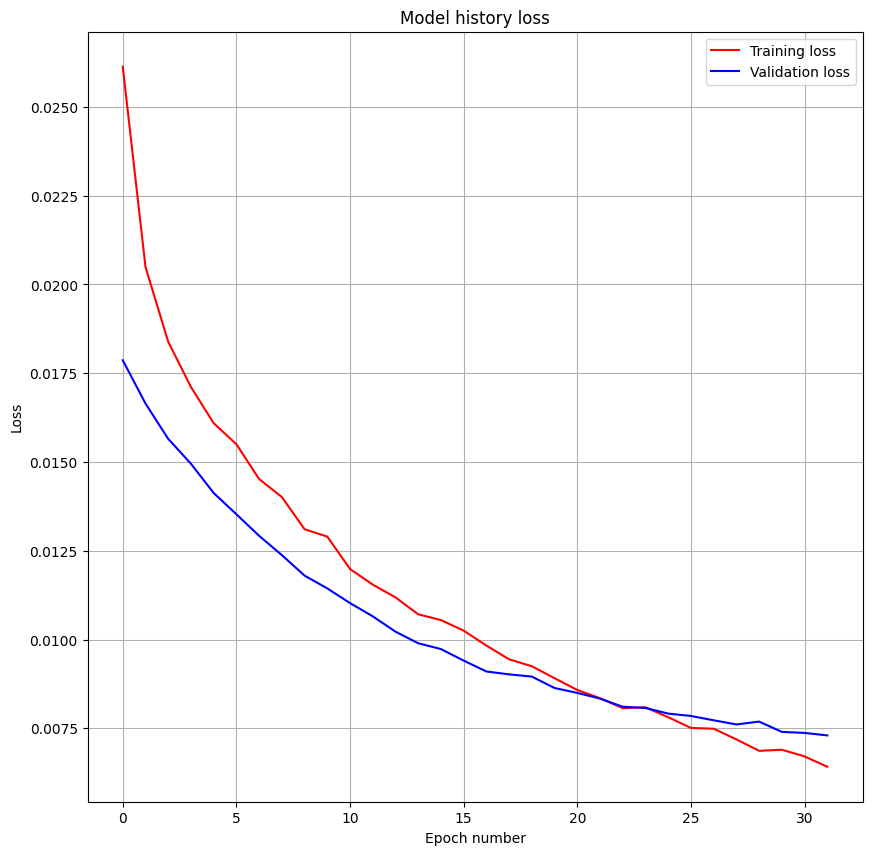

In [13]:
plt.figure(figsize=(10, 10))

# plot the losses
plt.plot(model_history.history['loss'], label='Training loss', color='red')
plt.plot(model_history.history['val_loss'], label='Validation loss', color='blue')
plt.xlabel('Epoch number')
plt.ylabel('Loss')
plt.grid()
plt.legend()
plt.title("Model history loss")
plt.show()

<font size="6"> Model's performance

Test on images - load 6 random images from the test dataset (which we haven't used in the training process) and use our model for OBB object detection.

1/1 [==============================] - 0s 20ms/step


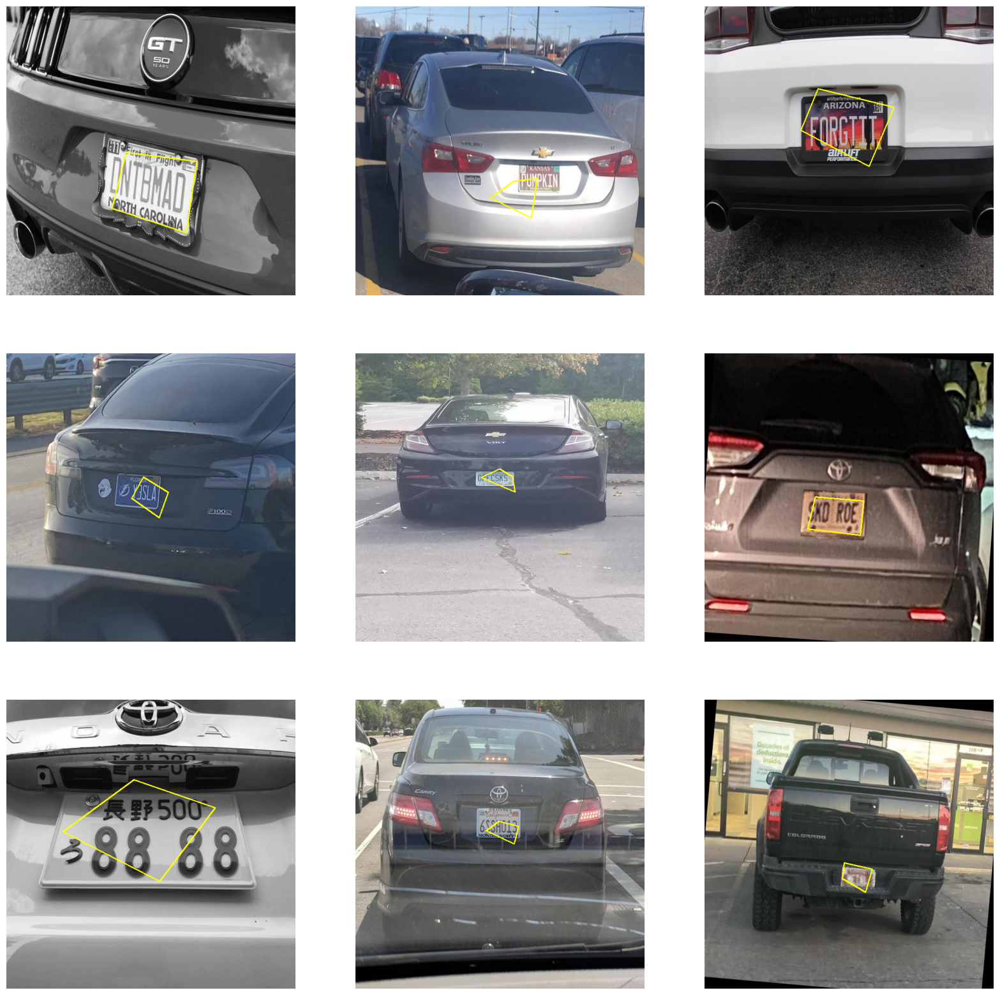

In [18]:
# Reload model in case there was a crash
# model = load_model('OOB_object_detection_model.h5')

image_names = []
labels = []

# load the test images metadata
test_folder = "./Dataset/test/"
image_files = os.listdir(test_folder + 'images')
for image_name in image_files:
    image_names.append(image_name)

# select 9 random indexes to be our test images
selected_indexes = np.random.choice(len(image_names), size=9, replace=False)

plt.figure(figsize=(20, 20))

# iterate through the selected images
for i,index in enumerate(selected_indexes):
  image_path = test_folder + 'images/' + image_names[index]
  # use our model for OBB object detection perdiction
  box_prediction = predict_image(load_img(image_path, target_size=(224, 224)), model)
  # draw the perdictions on the image
  image = prepare_image(cv2.imread(image_path), box_prediction)
  plt.subplot(3, 3, i+1)
  plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
  plt.axis('off')

plt.show()
